In [1]:
import importlib
import time
import math
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from scipy import ndimage

In [2]:
from multi_loc import covariance, assimilate

In [3]:
%matplotlib inline

In [4]:
def imshow(X, title=None, vmin=None, vmax=None, cmap=None):
    plt.figure()
    im = plt.imshow(X, vmin=vmin, vmax=vmax, cmap=cmap)
    plt.colorbar(im)
    plt.title(title)

512
long variance:  1.007731840725672
short variance:  1.0
Log10(condition):  19.644439415277176
0.6000000000000001
1.0
P_sqrt
P_inv_sqrt
R_sqrt
R_inv_sqrt
U
S
VT
H
Tx
Tx_inv
Ty
Ty_inv


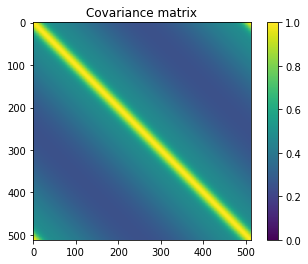

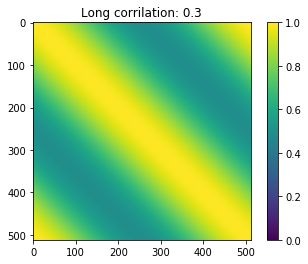

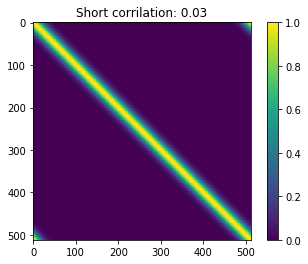

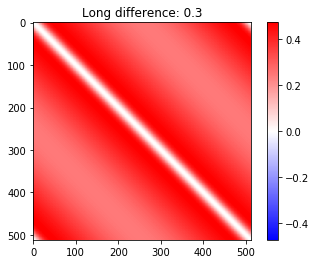

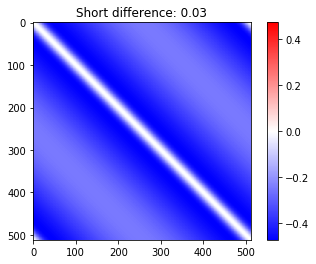

...

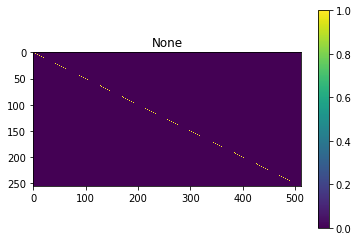

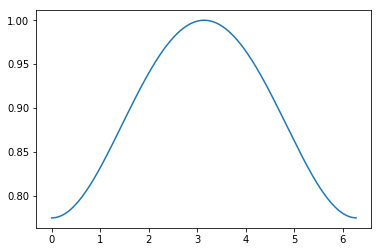

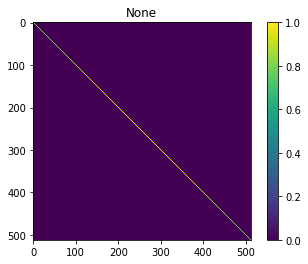

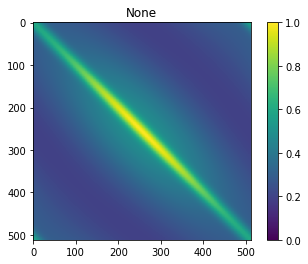

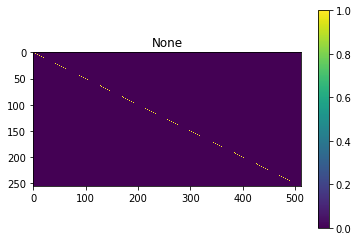

In [5]:
dimension = 2**9
print(dimension)
rho0_l = 0.3
rho0_s = 0.03
# rho0 = 0.2
# dx = 0.25
dx = 1/dimension

# obs_size = int(dimension/2)
# H = assimilate.random_H(dimension, obs_size)

H = np.eye(dimension)[::2]
obs_size = H.shape[0]

rho = np.arange(dimension, dtype=float)
rho = np.minimum(rho, (dimension - rho) % dimension)
rho = rho*dx

eig_val_l, eig_vec_l, P_l, sort_index = covariance.generate_circulant(
    dimension, dx, rho0_l, covariance.fft_sqd_exp_1d,
    return_Corr=True, return_sort_ind=True)
print('long variance: ', eig_val_l.mean())
eig_val_l = eig_val_l / eig_val_l.mean()
sort_index = np.argsort(sort_index)
eig_val_l = eig_val_l[sort_index]
eig_vec_l = eig_vec_l[:, sort_index]
P_l = eig_vec_l @ np.diag(eig_val_l) @ eig_vec_l.conj().T
P_l = P_l.real

eig_val_s, eig_vec_s, P_s, sort_index = covariance.generate_circulant(
    dimension, dx, rho0_s, covariance.fft_sqd_exp_1d,
    return_Corr=True, return_sort_ind=True)
print('short variance: ', eig_val_s.mean())
eig_val_s = eig_val_s / eig_val_s.mean()
sort_index = np.argsort(sort_index)
eig_val_s = eig_val_s[sort_index]
eig_vec_s = eig_vec_s[:, sort_index]
P_s = eig_vec_s @ np.diag(eig_val_s) @ eig_vec_s.conj().T
P_s = P_s.real
#P_s = P_s/P_s.max()

al = 0.5
eig_val = (1 - al) * eig_val_s + al * eig_val_l
eig_vec = eig_vec_l.copy()

eig_val = eig_val / eig_val.mean()

sort_index = np.argsort(eig_val)[::-1]
eig_val = eig_val[sort_index]
eig_vec = eig_vec[:, sort_index]

P = eig_vec @ np.diag(eig_val) @ eig_vec.conj().T
P = P.real

sort_index = np.argsort(eig_val_l)[::-1]
eig_val_l = eig_val_l[sort_index]
eig_vec_l = eig_vec_l[:, sort_index]

sort_index = np.argsort(eig_val_s)[::-1]
eig_val_s = eig_val_s[sort_index]
eig_vec_s = eig_vec_s[:, sort_index]


R = np.eye(obs_size)

trans_mats_true = assimilate.transformation_matrices(
    H, eig_val_p=eig_val, eig_vec_p=eig_vec,
    R=R, return_Ts=True)


trans_mats_long = assimilate.transformation_matrices(
    H, eig_val_p=eig_val_l, eig_vec_p=eig_vec_l,
    R=R, return_Ts=True)


trans_mats_short = assimilate.transformation_matrices(
    H, eig_val_p=eig_val_s, eig_vec_p=eig_vec_s,
    R=R, return_Ts=True)


for key, val in trans_mats_true.items():
    exec(key + '=val')
for key, val in trans_mats_long.items():
    exec(key+'_l' + '=val')
for key, val in trans_mats_short.items():
    exec(key+'_s' + '=val')

imshow(P, title='Covariance matrix', vmin=0, vmax=1)
imshow(P_l, title=f'Long corrilation: {rho0_l}', vmin=0, vmax=1)
imshow(P_s, title=f'Short corrilation: {rho0_s}', vmin=0, vmax=1)

error_l = P_l - P
error_s = P_s - P

vmax = np.max([np.abs(error_l).max(),
               np.abs(error_s).max()])

imshow(error_l, title=f'Long difference: {rho0_l}',
       vmin=-vmax, vmax=vmax, cmap='bwr')
imshow(error_s, title=f'Short difference: {rho0_s}',
       vmin=-vmax, vmax=vmax, cmap='bwr')
print('Log10(condition): ',
      np.log10(np.linalg.cond(P)))

fig, ax = plt.subplots(1, 2)
ax[0].plot(eig_val)
ax[1].semilogy(eig_val)
plt.suptitle('Eigenvalues P')

fig, ax = plt.subplots(1, 2)
ax[0].plot(eig_val_l)
ax[1].semilogy(eig_val_l)
plt.suptitle('Eigenvalues P_l')

fig, ax = plt.subplots(1, 2)
ax[0].plot(eig_val_s)
ax[1].semilogy(eig_val_s)
plt.suptitle('Eigenvalues P_s')

imshow(P, vmin=0)
imshow(H)

x = np.arange(dimension, dtype=float)*(2 * np.pi)/dimension
A = 0.4
D = np.diag(np.sqrt(-0.5 * A * (np.cos(x) + 1) + 1))
print((D.diagonal()**2).min())
print((D.diagonal()**2).max())
plt.figure()
plt.plot(x, D.diagonal())
imshow(D)

P = D @ P @ D

imshow(P, vmin=0)
imshow(H)

trans_mats = assimilate.transformation_matrices(
    H, P=P,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    print(key)
    exec(key + '=val')

dimension = 2**9
print(dimension)
rho0 = 0.3
dx = 1/dimension

H = np.eye(dimension)[::2]
obs_size = H.shape[0]

rho = np.arange(dimension, dtype=float)
rho = np.minimum(rho, (dimension - rho) % dimension)
rho = rho*dx

eig_val, eig_vec, P, sort_ind = covariance.generate_circulant(
    dimension, dx, rho0, covariance.fft_sqd_exp_1d,
    return_Corr=True,
    return_sort_ind=True)
R = np.eye(obs_size)

imshow(P, 'True Covariance Matrix')

trans_mats = assimilate.transformation_matrices(
    H, P=P,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    print(key)
    exec(key + '=val')

In [6]:
def angle(V0, V1):
    IPs = V0.T @ V1
    norm0 = (V0 ** 2).sum(axis=0)
    norm1 = (V1 ** 2).sum(axis=0)
    norm0 = norm0[:, None]
    norm1 = norm1[None, :]
    sigmas = sp.linalg.svd(
        IPs / np.sqrt(norm0 * norm1),
        compute_uv=False)
    dist = np.arccos(sigmas.min())
    return dist


def angle_2(V0, V1):
    norm0 = sp.linalg.norm(V0, ord=2, axis=0)
    norm1 = sp.linalg.norm(V1, ord=2, axis=0)
    V0 = V0/norm0
    V1 = V1/norm1
    IPs = V0.T @ V1
    sigmas = sp.linalg.svd(
        IPs,
        compute_uv=False)
    dist = np.arccos(sigmas)
    dist = dist.mean()
    return dist

In [7]:
ens_ens_size = 20
ens_size = 10
mu = np.zeros(dimension)
ensemble_array = np.ones(
    [dimension, ens_size, ens_ens_size,
    ]) * np.nan
for t_num in range(ens_ens_size):
    ensemble_array[:, :, t_num] = (
        assimilate.generate_ensemble(
            ens_size, mu, P_sqrt))

In [8]:
P_sample_array = np.zeros([dimension, dimension, ens_ens_size])
for ens_ens_num in range(ens_ens_size):
    P_sample_array[:, :, ens_ens_num] = np.cov(ensemble_array[:, :, ens_ens_num])

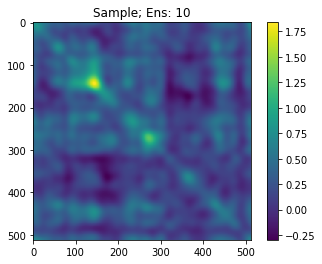

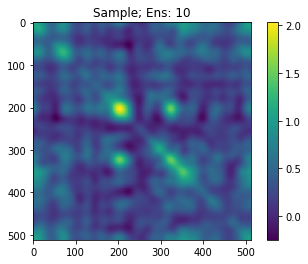

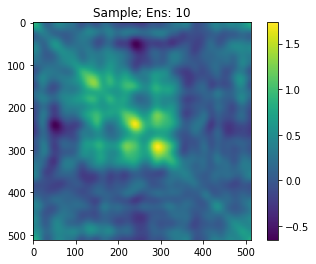

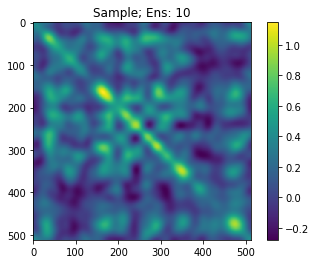

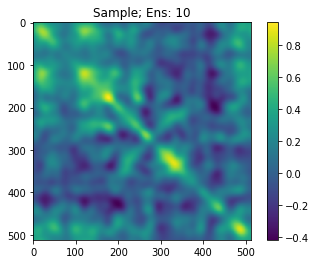

...

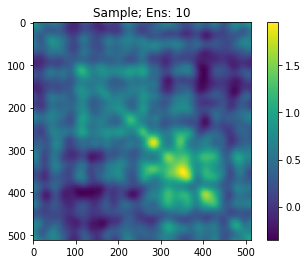

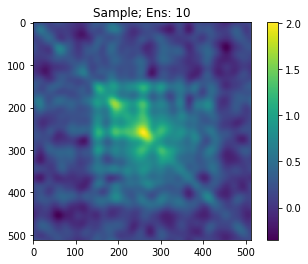

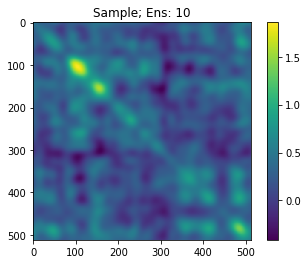

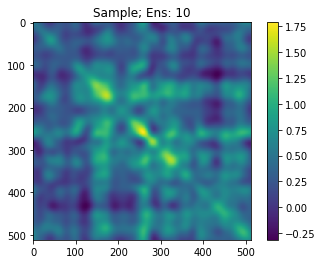

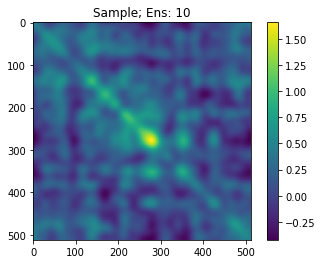

In [9]:
for ens_ens_num in range(ens_ens_size):
    imshow(P_sample_array[:, :, ens_ens_num],
           title=f'Sample; Ens: {ens_size}')

In [10]:
sig_array = np.concatenate(
    [[1], np.repeat([2], 15)])
total_sig = sig_array.sum()
s_array = np.ones([total_sig, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

In [11]:
for ens_count in range(ens_ens_size):
    this_trans_mats = assimilate.transformation_matrices(
        H, P=P_sample_array[:, :, ens_count],
        R=R)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    U_array[:, :total_sig, ens_count] = aU[:, :total_sig]
    s_array[:total_sig, ens_count] = aS.diagonal()[:total_sig]
    V_array[:, :total_sig, ens_count] = aVT[:total_sig, :].T

In [12]:
angle_array = np.ones([sig_array.size, ens_ens_size]) * np.nan
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T

    comb_count = 0
    for ens_count in range(ens_ens_size):
        aV = V_array[:, sig_slice, ens_count]
        angle_array[sig_count, ens_count] = angle(aV, true_V)


slice(0, 1, None)

slice(1, 3, None)

slice(3, 5, None)

slice(5, 7, None)

slice(7, 9, None)

slice(9, 11, None)

slice(11, 13, None)

slice(13, 15, None)

slice(15, 17, None)

slice(17, 19, None)

slice(19, 21, None)

slice(21, 23, None)

slice(23, 25, None)

slice(25, 27, None)

slice(27, 29, None)

slice(29, 31, None)


Text(0.5,1,'For Ensemble size: 10')

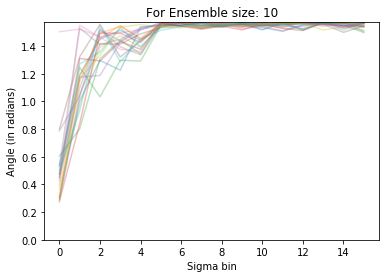

In [13]:
plt.figure()
plt.plot(angle_array, alpha=0.3)
plt.ylim([0, np.pi/2])
plt.xlabel('Sigma bin')
plt.ylabel('Angle (in radians)')
plt.title(f'For Ensemble size: {ens_size}')

In [14]:
ens_ens_size = 20
ens_size = 20
mu = np.zeros(dimension)
ensemble_array = np.ones(
    [dimension, ens_size, ens_ens_size,
    ]) * np.nan
for t_num in range(ens_ens_size):
    ensemble_array[:, :, t_num] = (
        assimilate.generate_ensemble(
            ens_size, mu, trans_mats['P_sqrt']))

In [15]:
P_sample_array = np.zeros([dimension, dimension, ens_ens_size])
for ens_ens_num in range(ens_ens_size):
    P_sample_array[:, :, ens_ens_num] = np.cov(ensemble_array[:, :, ens_ens_num])

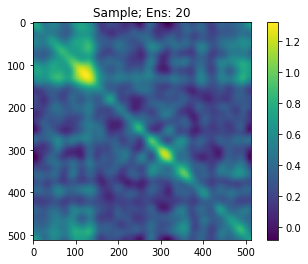

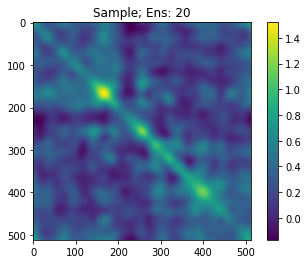

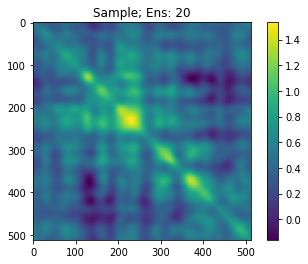

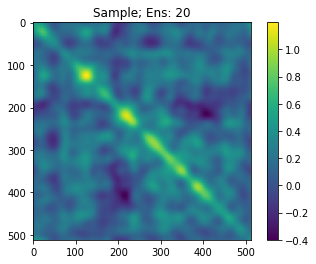

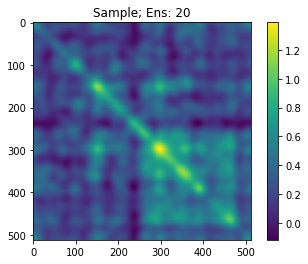

...

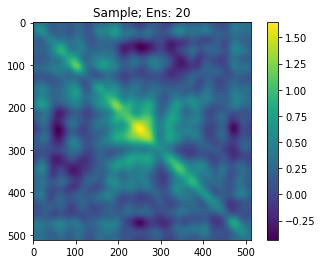

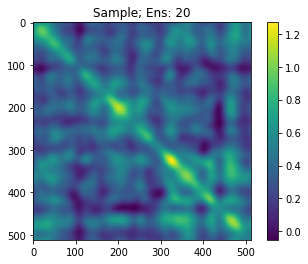

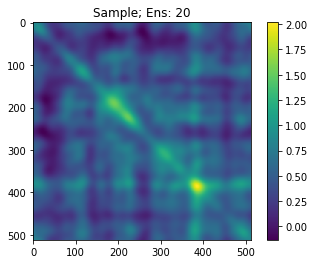

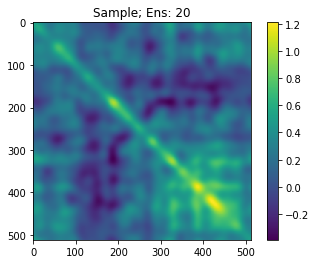

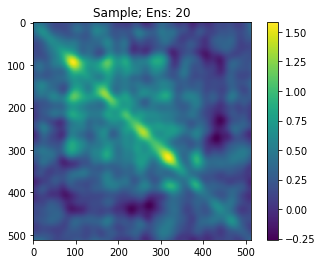

In [16]:
for ens_ens_num in range(ens_ens_size):
    imshow(P_sample_array[:, :, ens_ens_num],
           title=f'Sample; Ens: {ens_size}')

In [17]:
sig_array = np.concatenate(
    [[1], np.repeat([2], 15)])
total_sig = sig_array.sum()
s_array = np.ones([total_sig, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

In [18]:
for ens_count in range(ens_ens_size):
    this_trans_mats = assimilate.transformation_matrices(
        H, P=P_sample_array[:, :, ens_count],
        R=R)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    U_array[:, :total_sig, ens_count] = aU[:, :total_sig]
    s_array[:total_sig, ens_count] = aS.diagonal()[:total_sig]
    V_array[:, :total_sig, ens_count] = aVT[:total_sig, :].T

In [19]:
angle_array = np.ones([sig_array.size, ens_ens_size]) * np.nan
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T

    comb_count = 0
    for ens_count in range(ens_ens_size):
        aV = V_array[:, sig_slice, ens_count]
        angle_array[sig_count, ens_count] = angle(aV, true_V)


slice(0, 1, None)

slice(1, 3, None)

slice(3, 5, None)

slice(5, 7, None)

slice(7, 9, None)

slice(9, 11, None)

slice(11, 13, None)

slice(13, 15, None)

slice(15, 17, None)

slice(17, 19, None)

slice(19, 21, None)

slice(21, 23, None)

slice(23, 25, None)

slice(25, 27, None)

slice(27, 29, None)

slice(29, 31, None)


Text(0.5,1,'For Ensemble size: 20')

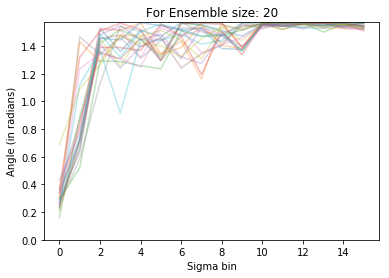

In [20]:
plt.figure()
plt.plot(angle_array, alpha=0.3)
plt.ylim([0, np.pi/2])
plt.xlabel('Sigma bin')
plt.ylabel('Angle (in radians)')
plt.title(f'For Ensemble size: {ens_size}')

In [21]:
ens_ens_size = 20
ens_size = 40
mu = np.zeros(dimension)
ensemble_array = np.ones(
    [dimension, ens_size, ens_ens_size,
    ]) * np.nan
for t_num in range(ens_ens_size):
    ensemble_array[:, :, t_num] = (
        assimilate.generate_ensemble(
            ens_size, mu, trans_mats['P_sqrt']))

In [22]:
P_sample_array = np.zeros([dimension, dimension, ens_ens_size])
for ens_ens_num in range(ens_ens_size):
    P_sample_array[:, :, ens_ens_num] = np.cov(ensemble_array[:, :, ens_ens_num])

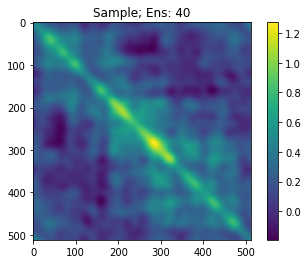

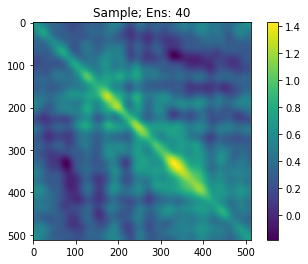

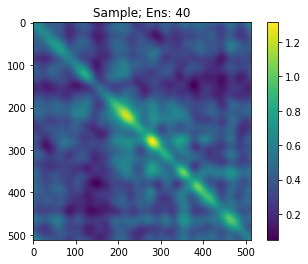

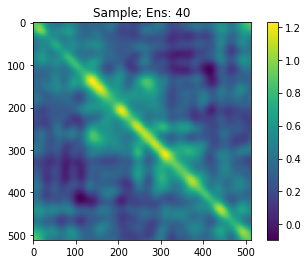

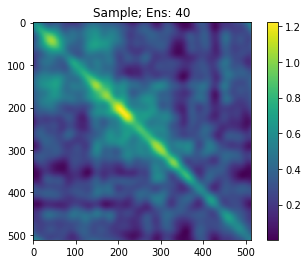

...

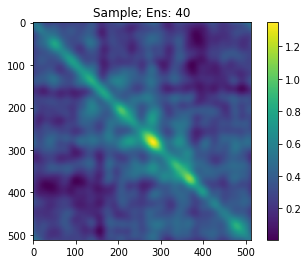

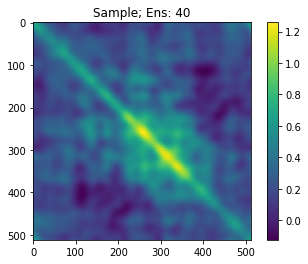

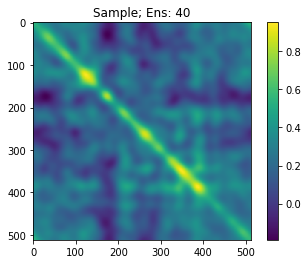

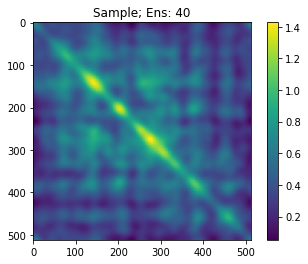

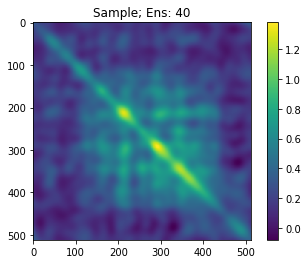

In [23]:
for ens_ens_num in range(ens_ens_size):
    imshow(P_sample_array[:, :, ens_ens_num],
           title=f'Sample; Ens: {ens_size}')

In [24]:
sig_array = np.concatenate(
    [[1], np.repeat([2], 15)])
total_sig = sig_array.sum()
s_array = np.ones([total_sig, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

In [25]:
for ens_count in range(ens_ens_size):
    this_trans_mats = assimilate.transformation_matrices(
        H, P=P_sample_array[:, :, ens_count],
        R=R)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    U_array[:, :total_sig, ens_count] = aU[:, :total_sig]
    s_array[:total_sig, ens_count] = aS.diagonal()[:total_sig]
    V_array[:, :total_sig, ens_count] = aVT[:total_sig, :].T

In [26]:
angle_array = np.ones([sig_array.size, ens_ens_size]) * np.nan
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T

    comb_count = 0
    for ens_count in range(ens_ens_size):
        aV = V_array[:, sig_slice, ens_count]
        angle_array[sig_count, ens_count] = angle(aV, true_V)


slice(0, 1, None)

slice(1, 3, None)

slice(3, 5, None)

slice(5, 7, None)

slice(7, 9, None)

slice(9, 11, None)

slice(11, 13, None)

slice(13, 15, None)

slice(15, 17, None)

slice(17, 19, None)

slice(19, 21, None)

slice(21, 23, None)

slice(23, 25, None)

slice(25, 27, None)

slice(27, 29, None)

slice(29, 31, None)


Text(0.5,1,'For Ensemble size: 40')

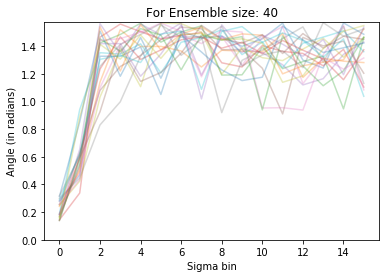

In [27]:
plt.figure()
plt.plot(angle_array, alpha=0.3)
plt.ylim([0, np.pi/2])
plt.xlabel('Sigma bin')
plt.ylabel('Angle (in radians)')
plt.title(f'For Ensemble size: {ens_size}')

In [28]:
ens_ens_size = 20
ens_size = 1000
mu = np.zeros(dimension)
ensemble_array = np.ones(
    [dimension, ens_size, ens_ens_size,
    ]) * np.nan
for t_num in range(ens_ens_size):
    ensemble_array[:, :, t_num] = (
        assimilate.generate_ensemble(
            ens_size, mu, trans_mats['P_sqrt']))

In [29]:
P_sample_array = np.zeros([dimension, dimension, ens_ens_size])
for ens_ens_num in range(ens_ens_size):
    P_sample_array[:, :, ens_ens_num] = np.cov(ensemble_array[:, :, ens_ens_num])

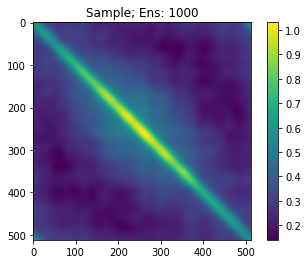

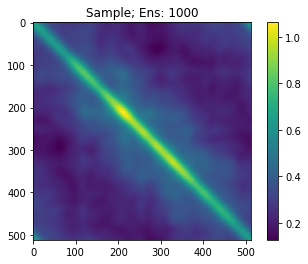

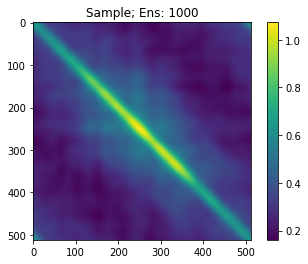

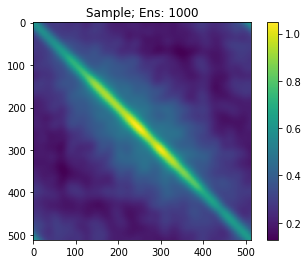

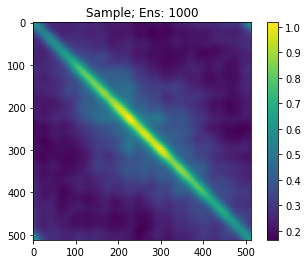

...

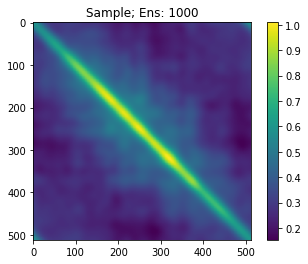

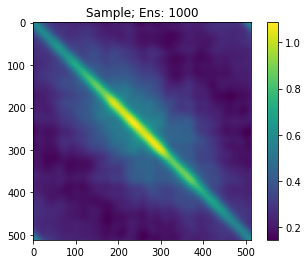

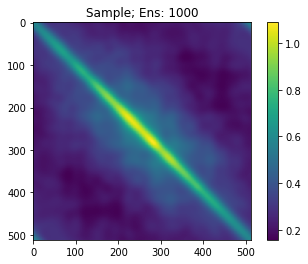

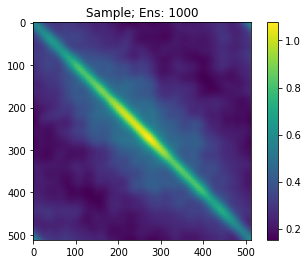

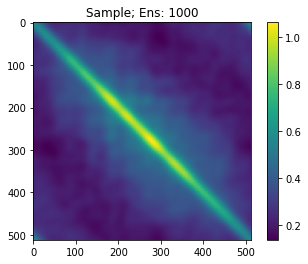

In [30]:
for ens_ens_num in range(ens_ens_size):
    imshow(P_sample_array[:, :, ens_ens_num],
           title=f'Sample; Ens: {ens_size}')

In [31]:
sig_array = np.concatenate(
    [[1], np.repeat([2], 15)])
total_sig = sig_array.sum()
s_array = np.ones([total_sig, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

In [32]:
for ens_count in range(ens_ens_size):
    this_trans_mats = assimilate.transformation_matrices(
        H, P=P_sample_array[:, :, ens_count],
        R=R)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    U_array[:, :total_sig, ens_count] = aU[:, :total_sig]
    s_array[:total_sig, ens_count] = aS.diagonal()[:total_sig]
    V_array[:, :total_sig, ens_count] = aVT[:total_sig, :].T

In [33]:
angle_array = np.ones([sig_array.size, ens_ens_size]) * np.nan
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T

    comb_count = 0
    for ens_count in range(ens_ens_size):
        aV = V_array[:, sig_slice, ens_count]
        angle_array[sig_count, ens_count] = angle(aV, true_V)


slice(0, 1, None)

slice(1, 3, None)

slice(3, 5, None)

slice(5, 7, None)

slice(7, 9, None)

slice(9, 11, None)

slice(11, 13, None)

slice(13, 15, None)

slice(15, 17, None)

slice(17, 19, None)

slice(19, 21, None)

slice(21, 23, None)

slice(23, 25, None)

slice(25, 27, None)

slice(27, 29, None)

slice(29, 31, None)


In [34]:
np.pi/2

1.5707963267948966

Text(0.5,1,'For Ensemble size: 1000')

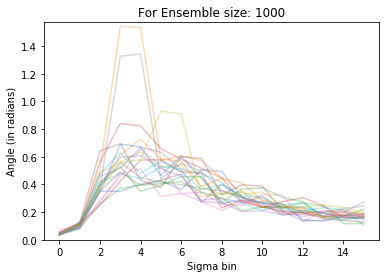

In [35]:
plt.figure()
plt.plot(angle_array, alpha=0.3)
plt.ylim([0, np.pi/2])
plt.xlabel('Sigma bin')
plt.ylabel('Angle (in radians)')
plt.title(f'For Ensemble size: {ens_size}')

In [36]:
ens_ens_size = 20
ens_size = 40
mu = np.zeros(dimension)
ensemble_array = np.ones(
    [dimension, ens_size, ens_ens_size,
    ]) * np.nan
for t_num in range(ens_ens_size):
    ensemble_array[:, :, t_num] = (
        assimilate.generate_ensemble(
            ens_size, mu, trans_mats['P_sqrt']))

In [37]:
P_sample_array = np.zeros([dimension, dimension, ens_ens_size])
for ens_ens_num in range(ens_ens_size):
    P_sample_array[:, :, ens_ens_num] = np.cov(ensemble_array[:, :, ens_ens_num])

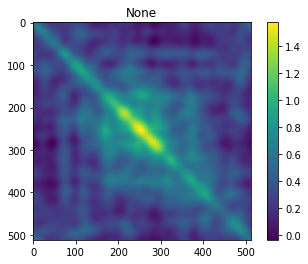

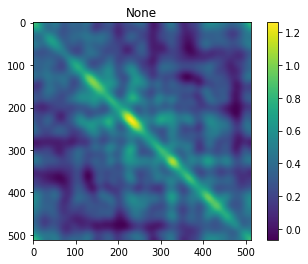

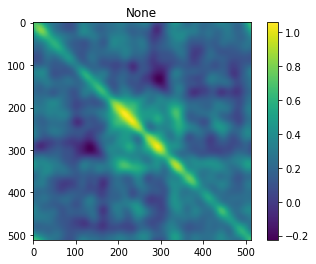

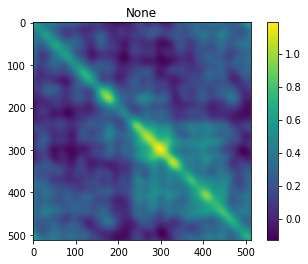

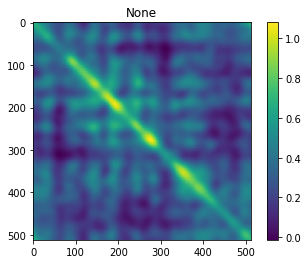

...

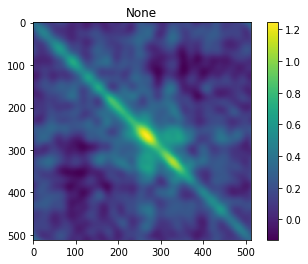

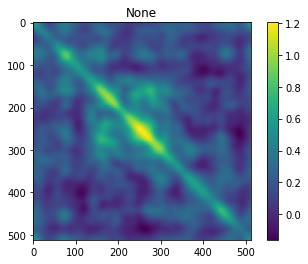

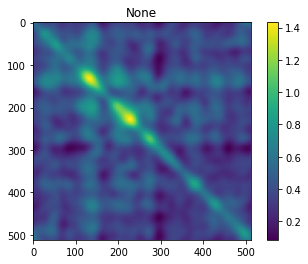

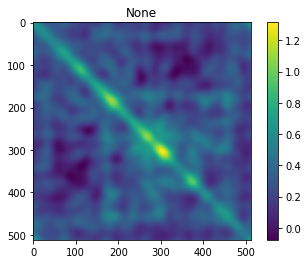

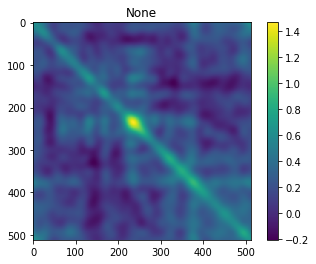

In [38]:
for ens_ens_num in range(ens_ens_size):
    imshow(P_sample_array[:, :, ens_ens_num])

In [39]:
sig_array = np.concatenate(
    [[1], np.repeat([2], 15)])
total_sig = sig_array.sum()
s_array = np.ones([total_sig, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

In [40]:
for ens_count in range(ens_ens_size):
    this_trans_mats = assimilate.transformation_matrices(
        H, P=P_sample_array[:, :, ens_count],
        R=R)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    U_array[:, :total_sig, ens_count] = aU[:, :total_sig]
    s_array[:total_sig, ens_count] = aS.diagonal()[:total_sig]
    V_array[:, :total_sig, ens_count] = aVT[:total_sig, :].T

In [41]:
angle_array = np.ones([sig_array.size, ens_ens_size]) * np.nan
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T

    comb_count = 0
    for ens_count in range(ens_ens_size):
        aV = V_array[:, sig_slice, ens_count]
        angle_array[sig_count, ens_count] = angle(aV, true_V)


slice(0, 1, None)

slice(1, 3, None)

slice(3, 5, None)

slice(5, 7, None)

slice(7, 9, None)

slice(9, 11, None)

slice(11, 13, None)

slice(13, 15, None)

slice(15, 17, None)

slice(17, 19, None)

slice(19, 21, None)

slice(21, 23, None)

slice(23, 25, None)

slice(25, 27, None)

slice(27, 29, None)

slice(29, 31, None)


Text(0.5,1,'For Ensemble size: 40')

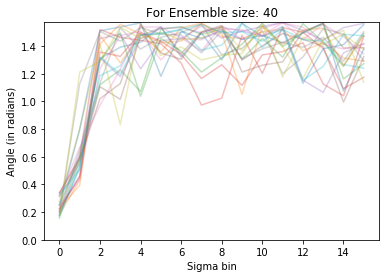

In [42]:
plt.figure()
plt.plot(angle_array, alpha=0.3)
plt.ylim([0, np.pi/2])
plt.xlabel('Sigma bin')
plt.ylabel('Angle (in radians)')
plt.title(f'For Ensemble size: {ens_size}')

/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


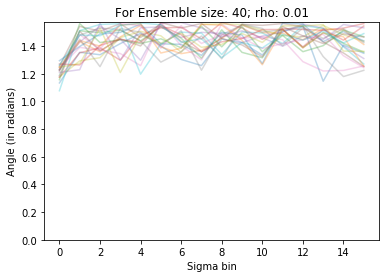

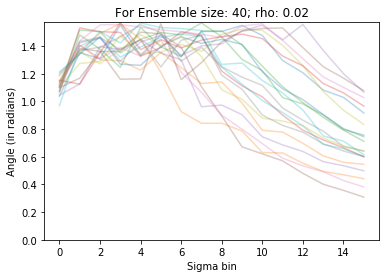

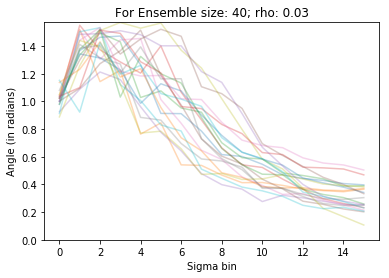

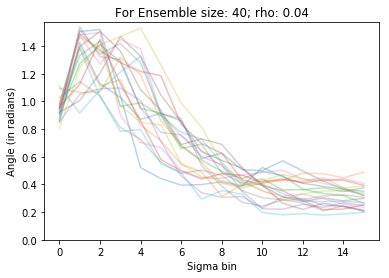

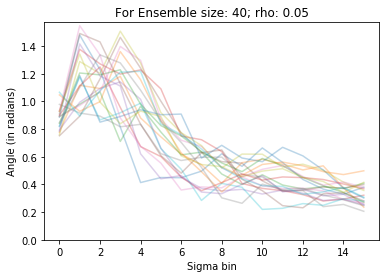

...

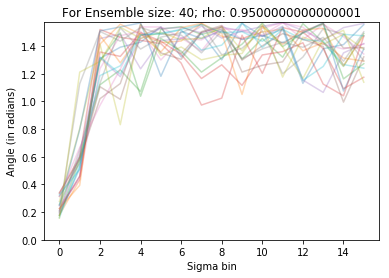

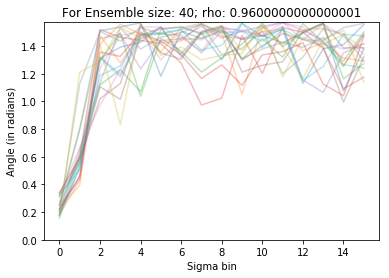

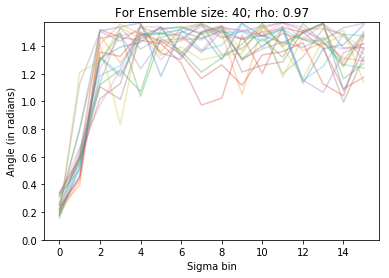

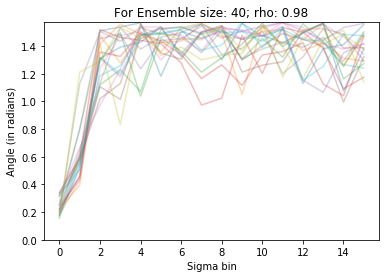

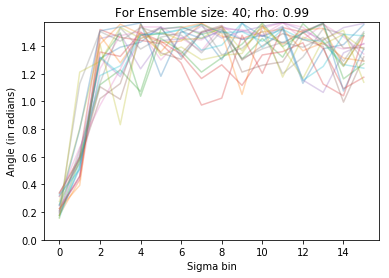

In [44]:
rho_array = np.arange(0.01, 1, .01)
for rho_loc in rho_array:
    sig_array = np.concatenate(
        [[1], np.repeat([2], 15)])
    total_sig = sig_array.sum()
    s_array = np.ones([total_sig, ens_ens_size]) * np.nan
    U_array = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
    V_array = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

    [loc] = covariance.generate_circulant(
        dimension, dx, rho_loc, covariance.fft_sqd_exp_1d,
        return_Corr=True, return_eig=False)
    loc /= loc.max()
#     imshow(loc, vmin=0)

    for ens_count in range(ens_ens_size):
        this_trans_mats = assimilate.transformation_matrices(
            H, P=P_sample_array[:, :, ens_count] * loc,
            R=R)

        aU = this_trans_mats['U']
        aS = this_trans_mats['S']
        aVT = this_trans_mats['VT']

        U_array[:, :total_sig, ens_count] = aU[:, :total_sig]
        s_array[:total_sig, ens_count] = aS.diagonal()[:total_sig]
        V_array[:, :total_sig, ens_count] = aVT[:total_sig, :].T

    angle_array = np.ones([sig_array.size, ens_ens_size]) * np.nan
    last_sig = 0
    for sig_count, sig_num in enumerate(sig_array):
        sig_slice = slice(last_sig, last_sig + sig_num)
        last_sig = last_sig + sig_num
        true_V = VT[sig_slice].T

        comb_count = 0
        for ens_count in range(ens_ens_size):
            aV = V_array[:, sig_slice, ens_count]
            angle_array[sig_count, ens_count] = angle(aV, true_V)

    plt.figure()
    plt.plot(angle_array, alpha=0.3)
    plt.ylim([0, np.pi/2])
    plt.xlabel('Sigma bin')
    plt.ylabel('Angle (in radians)')
    plt.title(f'For Ensemble size: {ens_size}; rho: {rho_loc}')